In [14]:
pip install catboost lightgbm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 10.3 MB/s eta 0:00:00


In [4]:
#Imports
import random
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics, tree
import warnings

from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix


In [ ]:
warnings.filterwarnings("ignore") # many warnings appeared for the random forest model.

# Step 1: Generate dataset
np.random.seed(42)
n_samples = 40000

a = np.random.uniform(-10, 10, n_samples)
b = np.random.uniform(-10, 10, n_samples)

r = (a**2 - 4*b < 0).astype(int)  # 1 if complex roots, 0 if real roots

# Balance the dataset
ones = np.where(r == 1)[0]
zeros = np.where(r == 0)[0]
selected_zeros = np.random.choice(zeros, size=int(len(ones) * 1.5), replace=False) #results in at least 33% of r being complex
selected_indices = np.concatenate([ones, selected_zeros])
np.random.shuffle(selected_indices)

a, b, r = a[selected_indices], b[selected_indices], r[selected_indices]

# Convert to DataFrame
data = pd.DataFrame({'a': a, 'b': b, 'r': r})

# Save dataset to CSV
data.to_csv("quadratic_data.csv", index=False)

# Step 2: Split dataset
X = data[['a', 'b']]
y = data['r']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


##SVM Model + Results

In [ ]:
svmModel = SVC(kernel= 'poly', degree = 2, C=1, probability=True)
svmModel.fit(X_train, y_train)
y_pred = svmModel.predict(X_test)
y_prob = svmModel.predict_proba(X_test)[:, 1] if hasattr(svmModel, "predict_proba") else None
acc = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
specificity = recall_score(y_test, y_pred, pos_label=0)
auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
cross_val = np.mean(cross_val_score(svmModel, X, y, cv=5))
results = []
results.append(['SVM', acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)



  Model  Accuracy  Precision    Recall  Specificity  F1 Score      AUC  \
0   SVM  0.763882   0.670113  0.807236     0.734968  0.732311  0.85723   

   CV Score  
0  0.790193  


Results are worse because of one less coefficient?

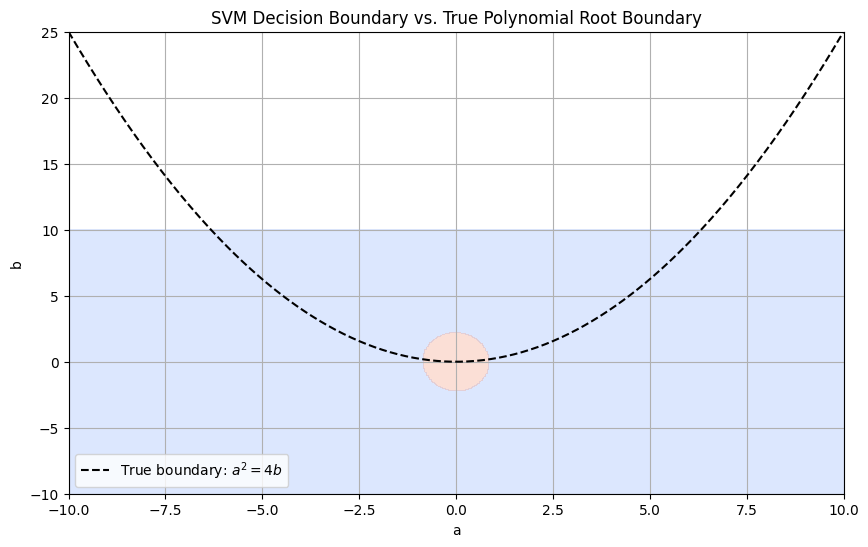

In [ ]:
#Visualizations of SVM
import numpy as np
import matplotlib.pyplot as plt

# Create a grid of values for a and b
a_vals = np.linspace(-10, 10, 500)
b_vals = np.linspace(-10, 10, 500)
A, B = np.meshgrid(a_vals, b_vals)
X_grid = np.c_[A.ravel(), B.ravel()]

Z = svmModel.predict(X_grid)
Z = Z.reshape(A.shape)

plt.figure(figsize=(10, 6))
# Plot SVM decision boundary
plt.contourf(A, B, Z, alpha=0.3, cmap='coolwarm', levels=1)

# True boundary: a^2 = 4b  →  b = a^2 / 4
a_curve = np.linspace(-10, 10, 500)
b_curve = (a_curve**2) / 4
plt.plot(a_curve, b_curve, 'k--', label='True boundary: $a^2 = 4b$')

plt.xlabel("a")
plt.ylabel("b")
plt.title("SVM Decision Boundary vs. True Polynomial Root Boundary")
plt.legend()
plt.grid(True)
plt.xlim(-10, 10)
plt.ylim(-10, 25)
plt.show()

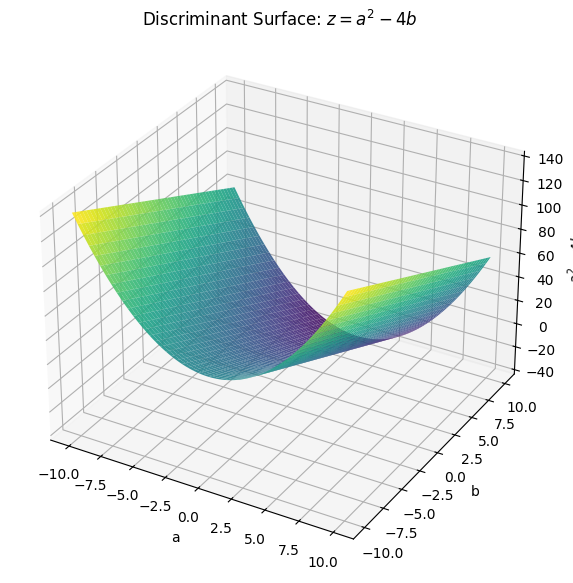

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Create grid of a and b values
a_vals = np.linspace(-10, 10, 200)
b_vals = np.linspace(-10, 10, 200)
A, B = np.meshgrid(a_vals, b_vals)
Z = A**2 - 4*B  # Discriminant function

# Plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(A, B, Z, cmap='viridis', alpha=0.9)
ax.set_xlabel('a')
ax.set_ylabel('b')
ax.set_zlabel('$a^2 - 4b$')
ax.set_title('Discriminant Surface: $z = a^2 - 4b$')
plt.show()

In [ ]:
# Step 3: Train and evaluate models
models = {
    "Decision Tree": DecisionTreeClassifier(criterion = 'gini',random_state=42),
    "Neural Network": MLPClassifier(hidden_layer_sizes=(32, 16), max_iter=500, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "SVM": SVC(probability=True)
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

# Save results to CSV
results_df.to_csv("model_results.csv", index=False)

In [ ]:
results_df

,Model,Accuracy,Precision,Recall,Specificity,F1 Score,AUC,CV Score
0,Decision Tree,0.995488,0.988327,0.989610,0.996998,0.988968,0.993304,0.995700
1,Neural Network,0.998806,0.996111,0.998052,0.998999,0.997081,0.999990,0.997479
2,XGBoost,0.997346,0.992866,0.994156,0.998165,0.993511,0.999970,0.996629
3,SVM,0.997877,0.995449,0.994156,0.998833,0.994802,0.999984,0.997505


In [ ]:
# Step 3: Train and evaluate models with different parameters. This takes almost 2 hours to run!
models = {
    "Decision Tree": DecisionTreeClassifier(criterion = 'gini', random_state=42, max_depth=2), #added gini index
    "Neural Network": MLPClassifier(hidden_layer_sizes=(16, 8), max_iter=300, random_state=42), # decresed the amount of neurons in the hidden layers by half.
    "Logistic Regression": LogisticRegression(max_iter=100),
    "Random Forest": RandomForestClassifier( max_depth=2, n_estimators=50, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=100, learning_rate = 0.5,use_label_encoder=False, eval_metric='logloss', random_state=42),
    "SVM": SVC(kernel = 'linear', probability=False)
}

results = []

for name, model in models.items():#Filling out the table of results
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

#Decision Tree and XGBoost

In [ ]:
warnings.filterwarnings("ignore") # many warnings appeared for the random forest model.

# Step 1: Generate dataset
np.random.seed(42)
n_samples = 40000

a = np.random.uniform(-10, 10, n_samples)
b = np.random.uniform(-10, 10, n_samples)


r = (a**2 - 4*b < 0).astype(int)  # 1 if complex roots, 0 if real roots

# Balance the dataset
ones = np.where(r == 1)[0]
zeros = np.where(r == 0)[0]
selected_zeros = np.random.choice(zeros, size=int(len(ones) * 1.5), replace=False) #results in at least 33% of r being complex
selected_indices = np.concatenate([ones, selected_zeros])
np.random.shuffle(selected_indices)

a, b, r = a[selected_indices], b[selected_indices], r[selected_indices]

# Convert to DataFrame
data = pd.DataFrame({'a': a, 'b': b, 'r': r})

# Save dataset to CSV
data.to_csv("quadratic_data.csv", index=False)

# Step 2: Split dataset
X = data[['a', 'b']]
y = data['r']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [ ]:
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

           Model  Accuracy  Precision    Recall  Specificity  F1 Score  \
0  Decision Tree  0.995491   0.992904  0.995848     0.995253  0.994374   
1        XGBoost  0.996203   0.994083  0.996441     0.996044  0.995261   

        AUC  CV Score  
0  0.995551  0.994778  
1  0.999938  0.995775  


In [ ]:
#added features: a^2, b^2, ab
data['a_squared'] = data['a'] ** 2
data['b_squared'] = data['b'] ** 2
data['ab'] = data['a'] * data['b']

X = data[['a', 'b', 'a_squared', 'b_squared', 'ab']]
y = data['r']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [ ]:
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

           Model  Accuracy  Precision    Recall  Specificity  F1 Score  \
0  Decision Tree  0.995491   0.994659  0.994069     0.996440  0.994364   
1        XGBoost  0.996203   0.992916  0.997628     0.995253  0.995266   

        AUC  CV Score  
0  0.995254  0.995206  
1  0.999966  0.996677  


##Neural Network, CatBoost, and LightGBM

In [ ]:
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, ConfusionMatrixDisplay

warnings.filterwarnings("ignore") # many warnings appeared for the random forest model.

# Step 1: Generate dataset
np.random.seed(42)
n_samples = 40000

a = np.random.uniform(-10, 10, n_samples)
b = np.random.uniform(-10, 10, n_samples)


r = (a**2 - 4*b < 0).astype(int)  # 1 if complex roots, 0 if real roots

# Balance the dataset
ones = np.where(r == 1)[0]
zeros = np.where(r == 0)[0]
selected_zeros = np.random.choice(zeros, size=int(len(ones) * 1.5), replace=False) #results in at least 33% of r being complex
selected_indices = np.concatenate([ones, selected_zeros])
np.random.shuffle(selected_indices)

a, b, r = a[selected_indices], b[selected_indices], r[selected_indices]

# Convert to DataFrame
data = pd.DataFrame({'a': a, 'b': b, 'r': r})

# Save dataset to CSV
data.to_csv("quadratic_data.csv", index=False)

# Step 2: Split dataset
X = data[['a', 'b']]
y = data['r']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
models = {
    "cat_model" : CatBoostClassifier(verbose=0, random_state=42),
    "Neural Network": MLPClassifier(hidden_layer_sizes=(16, 8), max_iter=300, random_state=42),
    "lgbm_model" : LGBMClassifier(random_state=42),
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

[LightGBM] [Info] Number of positive: 6741, number of negative: 10112
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 16853, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.399988 -> initscore=-0.405515
[LightGBM] [Info] Start training from score -0.405515
[LightGBM] [Info] Number of positive: 6741, number of negative: 10112
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 16853, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.399988 -> initscore=-0.405515
[LightGBM] [Info] Start training from score -0.405515
[LightGBM] [Info] 

#Degree 3 Polynomial

In [6]:
#Imports
import random
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics, tree
import warnings

from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix



##SVM

In [7]:
# Step 1: Generate dataset
np.random.seed(42)
n_samples = 40000

a = np.random.uniform(-10, 10, n_samples)
b = np.random.uniform(-10, 10, n_samples)
c = np.random.uniform(-10, 10, n_samples)
beta = 2*a**3 - 3*a*b + c
alpha = a**2 - b

def label_data(alpha, beta):
    labels = np.ones_like(alpha, dtype=int)  # default: complex roots (label = 1)

    # If α > 0 and |β| <= 2 * α^(3/2), roots are real → label = 0
    mask_real = (alpha > 0) & (np.abs(beta) <= 2 * (alpha ** (3 / 2)))
    # if a > 0 and B = 0, roots are real
    mask_real_a = (alpha > 0) & (beta == 0)
    #If a > 0 and B < 2a^(3/2), roots are complex
    mask_complex = (alpha > 0) & (np.abs(beta) > 2 * (alpha ** (3 / 2)))
    #if a > 0 and B < -2a^(3/2), roots are complex
    mask_complex_a = (alpha > 0) & (beta < -2 * (alpha ** (3 / 2)))
    # if a = 0 or a < 0, roots are conmplex
    mask_complex_b = (alpha == 0) | (alpha < 0)

    labels[mask_real] = 0
    labels[mask_real_a] = 0
    labels[mask_complex] = 1
    labels[mask_complex_a] = 1
    labels[mask_complex_b] = 1
    return labels


# Create feature matrix
X = np.column_stack((alpha, beta))

# Get labels using your custom logic
y = label_data(alpha, beta)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# Train SVM with RBF kernel
svmModel = SVC(kernel='poly', degree = 3, C =1)
svmModel.fit(X_train, y_train)
y_pred = svmModel.predict(X_test)
svmModel = SVC(kernel='poly', degree=3, C=1, probability=True)
svmModel.fit(X_train_scaled, y_train)
y_pred = svmModel.predict(X_test_scaled)

# Get probability predictions - make sure we handle the case if they're not available
try:
    y_prob = svmModel.predict_proba(X_test_scaled)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
except (AttributeError, TypeError):
    y_prob = None
    auc = None

# Calculate metrics
acc = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
specificity = recall_score(y_test, y_pred, pos_label=0)

acc = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
specificity = recall_score(y_test, y_pred, pos_label=0)
auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
#Removed cross validation due to long computing time,
results = []
results.append(['SVM', acc, precision, recall, specificity, f1, auc])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC"])
print(results_df)

<ipython-input-7-b0b73bfc5f9f>:15: RuntimeWarning: invalid value encountered in power
  mask_real = (alpha > 0) & (np.abs(beta) <= 2 * (alpha ** (3 / 2)))
<ipython-input-7-b0b73bfc5f9f>:19: RuntimeWarning: invalid value encountered in power
  mask_complex = (alpha > 0) & (np.abs(beta) > 2 * (alpha ** (3 / 2)))
<ipython-input-7-b0b73bfc5f9f>:21: RuntimeWarning: invalid value encountered in power
  mask_complex_a = (alpha > 0) & (beta < -2 * (alpha ** (3 / 2)))


  Model  Accuracy  Precision    Recall  Specificity  F1 Score       AUC
0   SVM     0.731   0.823741  0.375164     0.950485  0.515534  0.691835


###SVM Visualizations

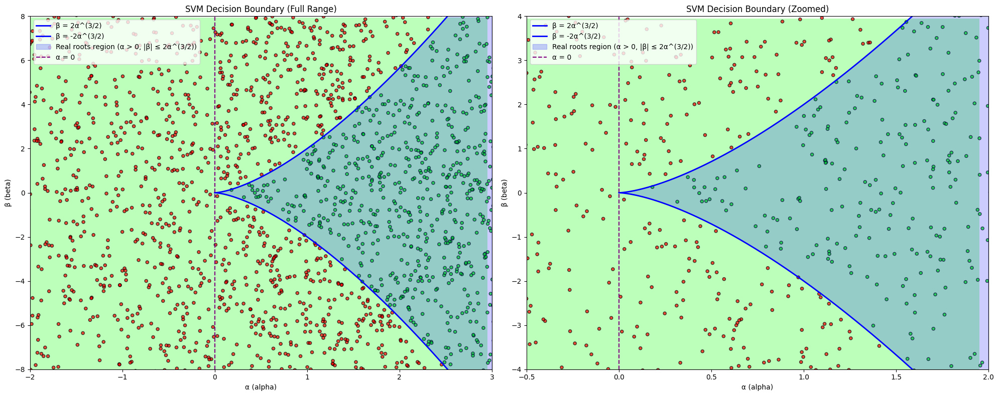

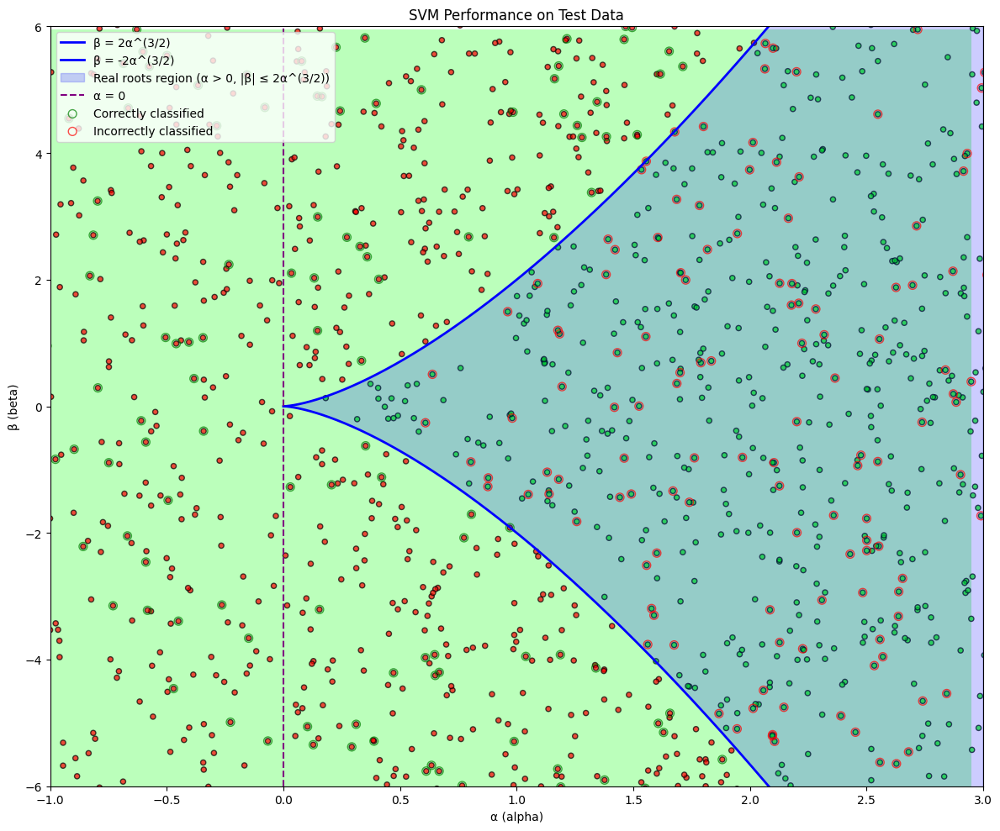

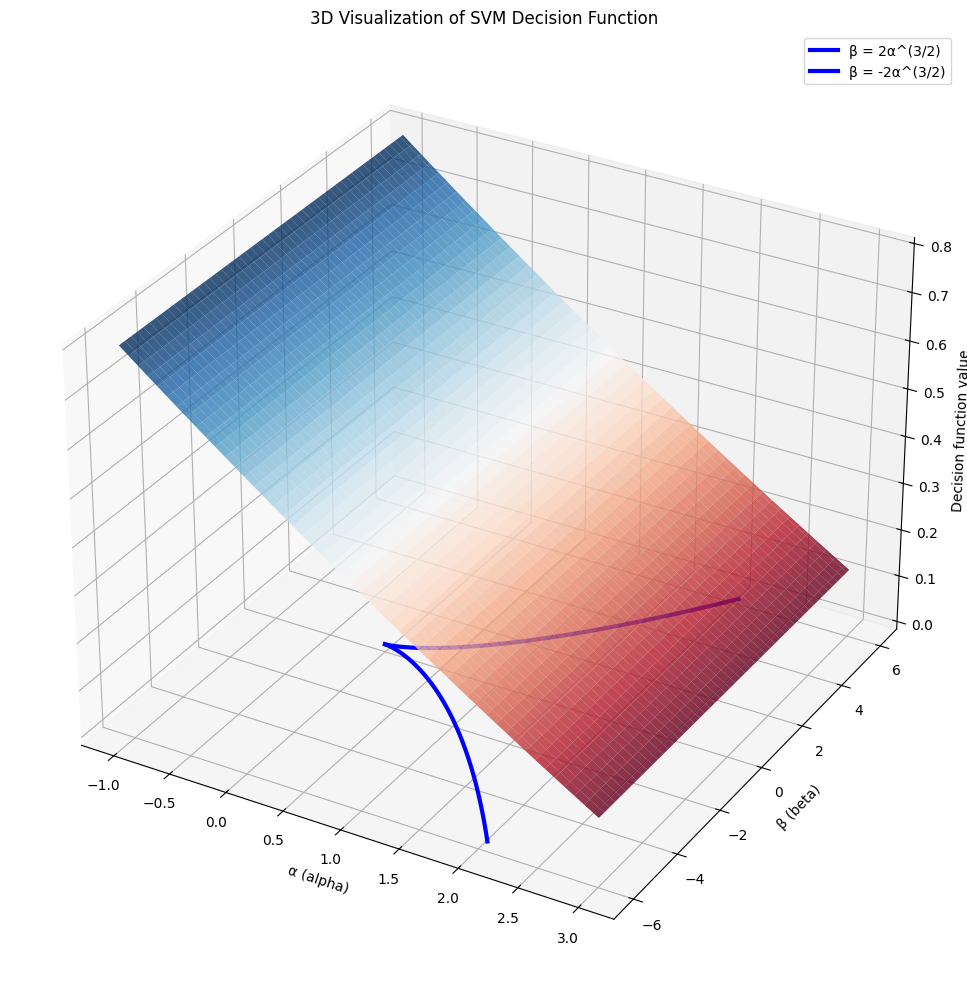


Model Performance Summary:
Accuracy: 0.7310
Precision: 0.8237
Recall: 0.3752
Specificity: 0.9505
F1 Score: 0.5155
AUC: 0.6918


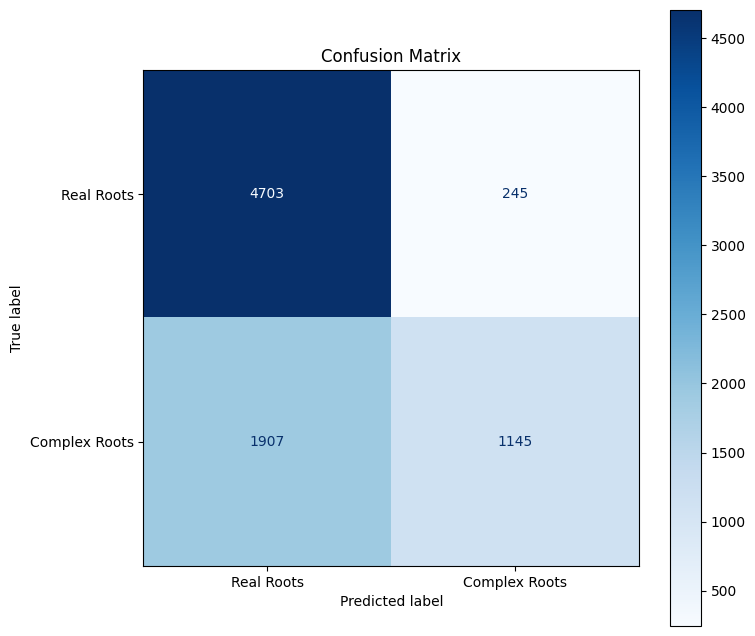

In [8]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

# Visualization functions
def plot_decision_boundary(X, y, model, scaler, ax=None, title=None, alpha_range=(-2, 3), beta_range=(-8, 8)):
    """Plot the decision boundary of the trained model"""
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))

    # Create a mesh grid for visualization
    h = 0.05  # step size in mesh
    x_min, x_max = alpha_range
    y_min, y_max = beta_range

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Scale the mesh points
    mesh_points = np.c_[xx.ravel(), yy.ravel()]
    mesh_points_scaled = scaler.transform(mesh_points)

    # Predict class labels for mesh grid points
    Z = model.predict(mesh_points_scaled)
    Z = Z.reshape(xx.shape)

    # Create a color map
    cmap_light = ListedColormap(['#AAFFAA', '#FFAAAA'])
    cmap_bold = ListedColormap(['#00FF00', '#FF0000'])

    # Plot the decision boundary
    ax.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.8)

    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold, s=20, edgecolors='k', alpha=0.7)

    ax.set_xlabel('α (alpha)')
    ax.set_ylabel('β (beta)')
    if title:
        ax.set_title(title)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    return ax

def plot_true_polynomial_curve(ax=None, alpha_range=(-2, 3)):
    """Plot the true polynomial curve β ± 2α^(3/2) = 0"""
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))

    alpha_values = np.linspace(0, alpha_range[1], 1000)  # Only plot for α > 0
    upper_curve = 2 * alpha_values**(3/2)
    lower_curve = -2 * alpha_values**(3/2)

    ax.plot(alpha_values, upper_curve, 'b-', linewidth=2, label='β = 2α^(3/2)')
    ax.plot(alpha_values, lower_curve, 'b-', linewidth=2, label='β = -2α^(3/2)')
    ax.fill_between(alpha_values, lower_curve, upper_curve, color='blue', alpha=0.2,
                    label='Real roots region (α > 0, |β| ≤ 2α^(3/2))')

    # Add α=0 line
    ax.axvline(x=0, color='purple', linestyle='--', label='α = 0')

    return ax

# Create visualization
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Plot 1: SVM decision boundary with full dataset
plot_decision_boundary(X, y, svmModel, scaler, ax=axes[0],
                      title='SVM Decision Boundary (Full Range)',
                      alpha_range=(-2, 3), beta_range=(-8, 8))
plot_true_polynomial_curve(ax=axes[0], alpha_range=(-2, 3))
axes[0].legend(loc='upper left')

# Plot 2: Zoomed in view focused on the boundary region
plot_decision_boundary(X, y, svmModel, scaler, ax=axes[1],
                      title='SVM Decision Boundary (Zoomed)',
                      alpha_range=(-0.5, 2), beta_range=(-4, 4))
plot_true_polynomial_curve(ax=axes[1], alpha_range=(-0.5, 2))
axes[1].legend(loc='upper left')

plt.tight_layout()
plt.savefig('svm_polynomial_boundary.png', dpi=300)
plt.show()

# Add a more detailed visualization showing test points and their predictions
fig, ax = plt.subplots(figsize=(12, 10))

# Plot decision boundary
plot_decision_boundary(X, y, svmModel, scaler, ax=ax,
                      title='SVM Performance on Test Data',
                      alpha_range=(-1, 3), beta_range=(-6, 6))
plot_true_polynomial_curve(ax=ax, alpha_range=(-1, 3))

# Highlight test points with wrong predictions
X_test_orig = X_test  # Original (unscaled) test points
wrong_predictions = (y_pred != y_test)
correct_predictions = ~wrong_predictions

# Plot correctly classified points
ax.scatter(X_test_orig[correct_predictions, 0], X_test_orig[correct_predictions, 1],
           s=50, linewidth=1, facecolors='none', edgecolors='green', alpha=0.7,
           label='Correctly classified')

# Plot incorrectly classified points
ax.scatter(X_test_orig[wrong_predictions, 0], X_test_orig[wrong_predictions, 1],
           s=50, linewidth=1, facecolors='none', edgecolors='red', alpha=0.7,
           label='Incorrectly classified')

ax.legend(loc='upper left')
plt.tight_layout()
plt.savefig('svm_test_performance.png', dpi=300)
plt.show()

# Create a 3D visualization of the decision function
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Create a mesh grid
x_min, x_max = -1, 3  # alpha range
y_min, y_max = -6, 6  # beta range
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Scale the mesh points
mesh_points = np.c_[xx.ravel(), yy.ravel()]
mesh_points_scaled = scaler.transform(mesh_points)

# Get decision function values
Z = svmModel.decision_function(mesh_points_scaled)
Z = Z.reshape(xx.shape)

# Plot the surface
surf = ax.plot_surface(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.8)

# Mark the zero decision boundary with a contour
ax.contour(xx, yy, Z, levels=[0], colors='k', linestyles='-')

# Plot true polynomial curves
alpha_values = np.linspace(0, x_max, 100)
upper_curve = 2 * alpha_values**(3/2)
lower_curve = -2 * alpha_values**(3/2)

# Create mask for valid values within range
upper_mask = (alpha_values >= x_min) & (upper_curve <= y_max) & (upper_curve >= y_min)
lower_mask = (alpha_values >= x_min) & (lower_curve <= y_max) & (lower_curve >= y_min)

# Plot true boundary curves on the Z=0 plane
ax.plot(alpha_values[upper_mask], upper_curve[upper_mask], np.zeros_like(alpha_values[upper_mask]),
        'b-', linewidth=3, label='β = 2α^(3/2)')
ax.plot(alpha_values[lower_mask], lower_curve[lower_mask], np.zeros_like(alpha_values[lower_mask]),
        'b-', linewidth=3, label='β = -2α^(3/2)')

ax.set_xlabel('α (alpha)')
ax.set_ylabel('β (beta)')
ax.set_zlabel('Decision function value')
ax.set_title('3D Visualization of SVM Decision Function')
ax.legend()

plt.tight_layout()
plt.savefig('svm_decision_function_3d.png', dpi=300)
plt.show()

# Print model performance summary
print("\nModel Performance Summary:")
print(f"Accuracy: {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"F1 Score: {f1:.4f}")
if auc is not None:
    print(f"AUC: {auc:.4f}")
else:
    print("AUC: Not available")

# Add a confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Real Roots', 'Complex Roots'])

fig, ax = plt.subplots(figsize=(8, 8))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='.0f')
plt.title('Confusion Matrix')
plt.savefig('svm_confusion_matrix.png', dpi=300)
plt.show()


##Numerical Root Finder

In [9]:
# 3. Get actual roots and count
def count_root_types(a, b, c):
    coeffs = [1, a, b, c]
    roots = np.roots(coeffs)
    real_roots = [r for r in roots if np.isreal(r)]
    complex_roots = [r for r in roots if not np.isreal(r)]
    return len(real_roots), len(complex_roots)

# 4. Predict using your rule
def predict_by_rule(alpha, beta):
    if alpha > 0:
        if np.abs(beta) <= 2 * (alpha ** (3 / 2)):
            return "real"
        else:
            return "complex"
    else:
        return "complex"

# Define generate_samples function
def generate_samples(n):
    """Generates random samples for a, b, and c."""
    a_vals = np.random.uniform(-10, 10, n)
    b_vals = np.random.uniform(-10, 10, n)
    c_vals = np.random.uniform(-10, 10, n)
    return a_vals, b_vals, c_vals

# Define compute_alpha_beta function
def compute_alpha_beta(a_vals, b_vals, c_vals):
    """Computes alpha and beta values."""
    alpha_vals = a_vals**2 - b_vals
    beta_vals = 2*a_vals**3 - 3*a_vals*b_vals + c_vals
    return alpha_vals, beta_vals
# 5. Run comparison over all samples
def evaluate_rule_vs_roots(n=1000):
    a_vals, b_vals, c_vals = generate_samples(n)
    alpha_vals, beta_vals = compute_alpha_beta(a_vals, b_vals, c_vals)

    correct = 0
    for i in range(n):
        a, b, c = a_vals[i], b_vals[i], c_vals[i]
        alpha, beta = alpha_vals[i], beta_vals[i]

        rule_prediction = predict_by_rule(alpha, beta)

        num_real, num_complex = count_root_types(a, b, c)
        actual = "real" if num_real == 3 else "complex"

        if rule_prediction == actual:
            correct += 1

    accuracy = correct / n
    print(f"Rule matched actual root behavior in {correct}/{n} cases → Accuracy = {accuracy:.4f}")

evaluate_rule_vs_roots(n=10000)

Rule matched actual root behavior in 7847/10000 cases → Accuracy = 0.7847


##Tree models

In [10]:
warnings.filterwarnings("ignore")
models = {
    "Decision Tree": DecisionTreeClassifier(max_depth = 5, min_samples_leaf=100, min_samples_split=300,  random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

           Model  Accuracy  Precision    Recall  Specificity  F1 Score  \
0  Decision Tree  0.749625   0.939648  0.367300     0.985449  0.528151   
1        XGBoost  0.840875   0.917802  0.640236     0.964632  0.754295   

        AUC  CV Score  
0  0.737655  0.752325  
1  0.929011  0.847200  


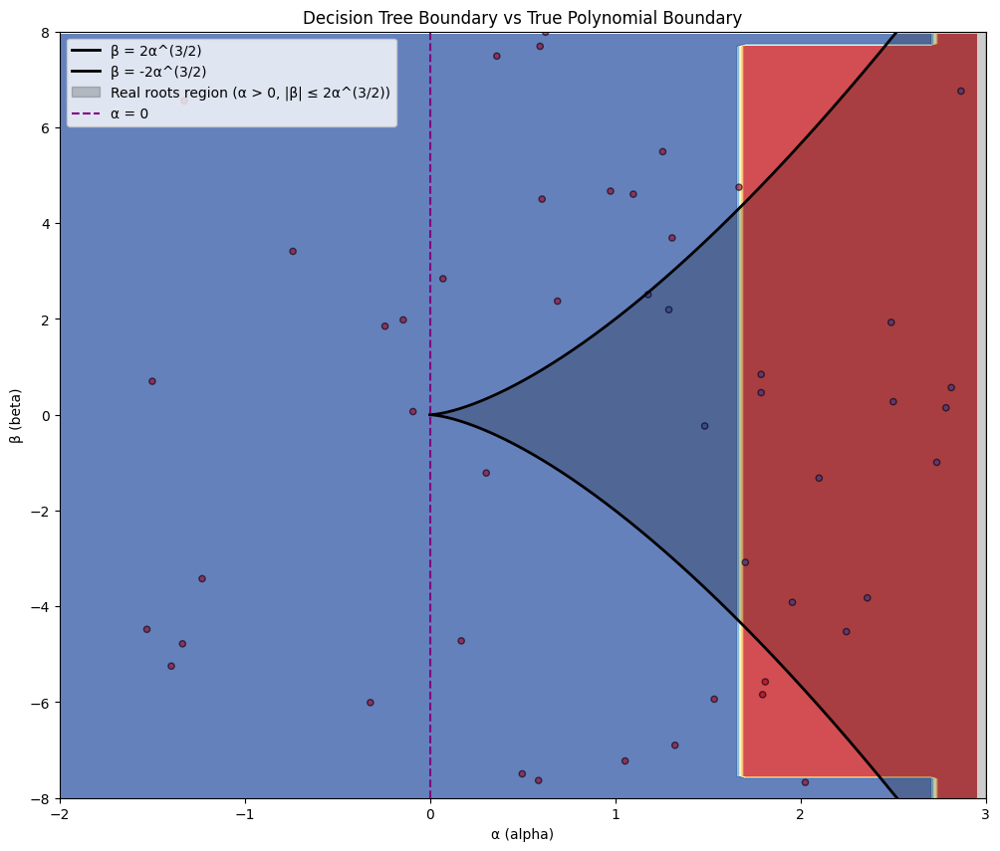

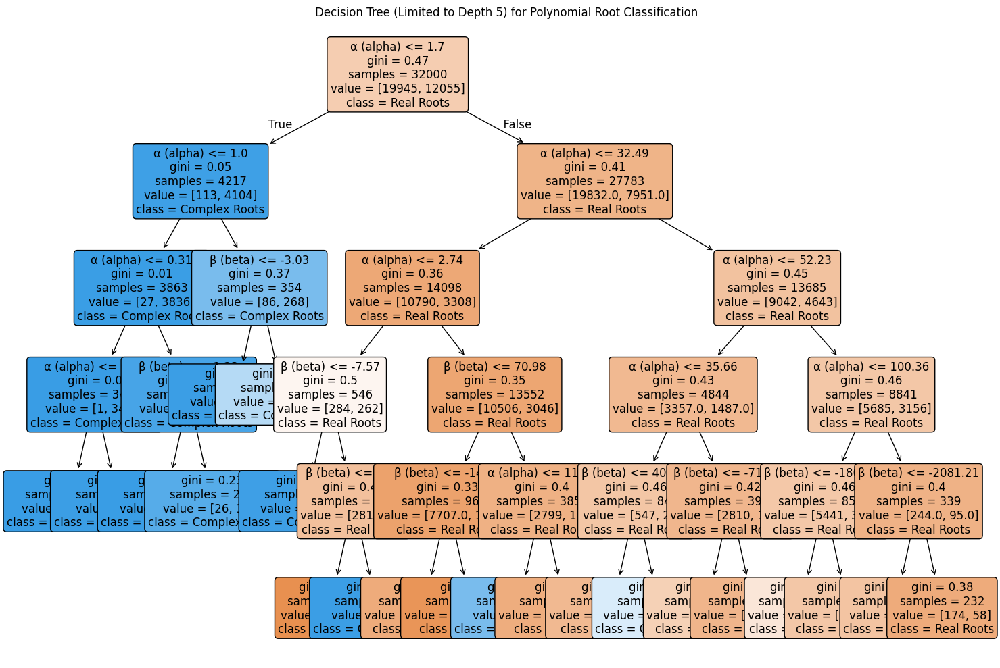

In [11]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

dt_model = models["Decision Tree"]

def plot_decision_boundaries():
    # Create a mesh grid for visualization
    x_min, x_max = -2, 3  # alpha range
    y_min, y_max = -8, 8  # beta range
    h = 0.05  # step size in mesh

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    mesh_points = np.c_[xx.ravel(), yy.ravel()]

    # Get predictions from decision tree
    Z = dt_model.predict(mesh_points)
    Z = Z.reshape(xx.shape)

    # Plot the decision boundary
    plt.figure(figsize=(12, 10))
    plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.RdYlBu)

    # Plot the true polynomial boundary
    alpha_values = np.linspace(0, x_max, 1000)  # Only plot for α > 0
    upper_curve = 2 * alpha_values**(3/2)
    lower_curve = -2 * alpha_values**(3/2)

    plt.plot(alpha_values, upper_curve, 'k-', linewidth=2, label='β = 2α^(3/2)')
    plt.plot(alpha_values, lower_curve, 'k-', linewidth=2, label='β = -2α^(3/2)')
    plt.fill_between(alpha_values, lower_curve, upper_curve, color='black', alpha=0.2,
                  label='Real roots region (α > 0, |β| ≤ 2α^(3/2))')

    # Add α=0 line
    plt.axvline(x=0, color='purple', linestyle='--', label='α = 0')

    # Plot a subset of the training data points for reference
    sample_idx = np.random.choice(len(X_train), size=1000, replace=False)
    plt.scatter(X_train[sample_idx, 0], X_train[sample_idx, 1],
                c=y_train[sample_idx], cmap=plt.cm.RdYlBu_r,
                edgecolors='k', alpha=0.6, s=20)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.xlabel('α (alpha)')
    plt.ylabel('β (beta)')
    plt.title('Decision Tree Boundary vs True Polynomial Boundary')
    plt.legend(loc="upper left")
    plt.savefig('decision_tree_boundary.png', dpi=300)
    plt.show()

# Plot the decision boundaries
plot_decision_boundaries()


# Create a smaller tree for better visualization
small_dt = DecisionTreeClassifier(random_state=42, min_samples_leaf=100, min_samples_split=300, max_depth=5)
small_dt.fit(X_train, y_train)

plt.figure(figsize=(15, 10))
plot_tree(small_dt,
          filled=True,
          rounded=True,
          feature_names=['α (alpha)', 'β (beta)'],
          class_names=['Real Roots', 'Complex Roots'],
          proportion=False,
          precision=2,
          fontsize=12)

plt.title('Decision Tree (Limited to Depth 5) for Polynomial Root Classification', fontsize=12)
plt.tight_layout()
plt.savefig('simplified_decision_tree.png', dpi=300, bbox_inches='tight')
plt.show()

###adding more features

In [12]:
# Step 1: Generate dataset
np.random.seed(42)
n_samples = 40000

a = np.random.uniform(-10, 10, n_samples)
b = np.random.uniform(-10, 10, n_samples)
c = np.random.uniform(-10, 10, n_samples)
beta = 2*a**3 - 3*a*b + c
alpha = a**2 - b

beta_squared = beta**2
alpha_cubed = alpha**3

def label_data(alpha, beta):
    labels = np.ones_like(alpha, dtype=int)  # default: complex roots (label = 1)

    # If α > 0 and |β| <= 2 * α^(3/2), roots are real → label = 0
    mask_real = (alpha > 0) & (np.abs(beta) <= 2 * (alpha ** (3 / 2)))
    # if a > 0 and B = 0, roots are real
    mask_real_a = (alpha > 0) & (beta == 0)
    #If a > 0 and B < 2a^(3/2), roots are complex
    mask_complex = (alpha > 0) & (np.abs(beta) > 2 * (alpha ** (3 / 2)))
    #if a > 0 and B < -2a^(3/2), roots are complex
    mask_complex_a = (alpha > 0) & (beta < -2 * (alpha ** (3 / 2)))
    # if a = 0 or a < 0, roots are conmplex
    mask_real_b = (alpha == 0) | (alpha < 0)

    labels[mask_real] = 0
    labels[mask_real_a] = 0
    labels[mask_complex] = 1
    labels[mask_complex_a] = 1
    labels[mask_real_b] = 1
    return labels


# Create feature matrix
X = np.column_stack((alpha, beta, alpha_cubed, beta_squared))

# Get labels using your custom logic
y = label_data(alpha, beta)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


warnings.filterwarnings("ignore")

models = {
    "Decision Tree": DecisionTreeClassifier(max_depth = 5, min_samples_leaf=100, min_samples_split=300,  random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

           Model  Accuracy  Precision    Recall  Specificity  F1 Score  \
0  Decision Tree  0.754375   0.958650  0.372215     0.990097  0.536228   
1        XGBoost  0.868875   0.954607  0.689056     0.979790  0.800381   

        AUC  CV Score  
0  0.744465  0.757800  
1  0.947735  0.874825  


##Additional Models

In [15]:
warnings.filterwarnings("ignore")

from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, ConfusionMatrixDisplay

# Step 1: Generate dataset
np.random.seed(42)
n_samples = 40000

a = np.random.uniform(-10, 10, n_samples)
b = np.random.uniform(-10, 10, n_samples)
c = np.random.uniform(-10, 10, n_samples)
beta = 2*a**3 - 3*a*b + c
alpha = a**2 - b

def label_data(alpha, beta):
    labels = np.ones_like(alpha, dtype=int)  # default: complex roots (label = 1)

    # If α > 0 and |β| <= 2 * α^(3/2), roots are real → label = 0
    mask_real = (alpha > 0) & (np.abs(beta) <= 2 * (alpha ** (3 / 2)))
    # if a > 0 and B = 0, roots are real
    mask_real_a = (alpha > 0) & (beta == 0)
    #If a > 0 and B < 2a^(3/2), roots are complex
    mask_complex = (alpha > 0) & (np.abs(beta) > 2 * (alpha ** (3 / 2)))
    #if a > 0 and B < -2a^(3/2), roots are complex
    mask_complex_a = (alpha > 0) & (beta < -2 * (alpha ** (3 / 2)))
    # if a = 0 or a < 0, roots are conmplex
    mask_complex_b = (alpha == 0) | (alpha < 0)

    labels[mask_real] = 0
    labels[mask_real_a] = 0
    labels[mask_complex] = 1
    labels[mask_complex_a] = 1
    labels[mask_complex_b] = 1
    return labels


# Create feature matrix
X = np.column_stack((alpha, beta))

# Get labels using your custom logic
y = label_data(alpha, beta)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



models = {
    "cat_model" : CatBoostClassifier(verbose=0, random_state=42),
    "Neural Network": MLPClassifier(hidden_layer_sizes=(16, 8), max_iter=300, random_state=42),
    "lgbm_model" : LGBMClassifier(random_state=42),
}

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = recall_score(y_test, y_pred, pos_label=0)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
    cross_val = np.mean(cross_val_score(model, X, y, cv=5))

    results.append([name, acc, precision, recall, specificity, f1, auc, cross_val])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC", "CV Score"])
print(results_df)

[LightGBM] [Info] Number of positive: 12055, number of negative: 19945
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.376719 -> initscore=-0.503499
[LightGBM] [Info] Start training from score -0.503499
[LightGBM] [Info] Number of positive: 12086, number of negative: 19914
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.377688 -> initscore=-0.499375
[LightGBM] [Info] Start training from score -0.499375
[LightGBM] [Info

#Degree 4 Polynomial

#Degree 5 Polynomial

In [16]:


import numpy as np
import pandas as pd

def generate_special_quintics(n_samples=1000, a_range=(-10, 10), b_range=(-10, 10), seed=42):
    np.random.seed(seed)
    a_vals = np.random.uniform(*a_range, size=n_samples)
    b_vals = np.random.uniform(*b_range, size=n_samples)

    data = []

    for a, b in zip(a_vals, b_vals):
        # Construct polynomial: f(x) = x(x^2 + ax + b)^2
        # Expand (x^2 + ax + b)^2
        # (x^2 + ax + b)^2 = x^4 + 2a x^3 + (a^2 + 2b)x^2 + 2ab x + b^2
        # Multiply by x: final form
        coeffs = [
            1,             # x^5
            2*a,           # x^4
            a**2 + 2*b,    # x^3
            2*a*b,         # x^2
            b**2,          # x^1
            0              # constant term
        ]

        # Discriminant of the inner quadratic
        disc = a**2 - 4*b
        label = int(disc < 0)  # 1 if complex roots exist, 0 if not

        data.append([a, b, *coeffs, label])

    columns = ['a', 'b', 'c5', 'c4', 'c3', 'c2', 'c1', 'c0', 'has_complex']
    return pd.DataFrame(data, columns=columns)
data = generate_special_quintics(n_samples=40000)


# Step 2: Split dataset
X = data[['a', 'b']]
y = data['has_complex']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train SVM with Poly kernel
svmModel = SVC(kernel='poly', degree = 5, C =1)
svmModel.fit(X_train, y_train)
y_pred = svmModel.predict(X_test)

# Get probability predictions - make sure we handle the case if they're not available
try:
    y_prob = svmModel.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_prob)
except (AttributeError, TypeError):
    y_prob = None
    auc = None

# Calculate metrics
acc = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
specificity = recall_score(y_test, y_pred, pos_label=0)
auc = roc_auc_score(y_test, y_prob) if y_prob is not None else None
#Removed cross validation due to long computing time, add back in later maybe....
results = []
results.append(['SVM', acc, precision, recall, specificity, f1, auc])

# Create DataFrame for results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy", "Precision", "Recall", "Specificity", "F1 Score", "AUC"])
print(results_df)

  Model  Accuracy  Precision    Recall  Specificity  F1 Score   AUC
0   SVM  0.854125   0.837327  0.390129     0.979517  0.532265  None


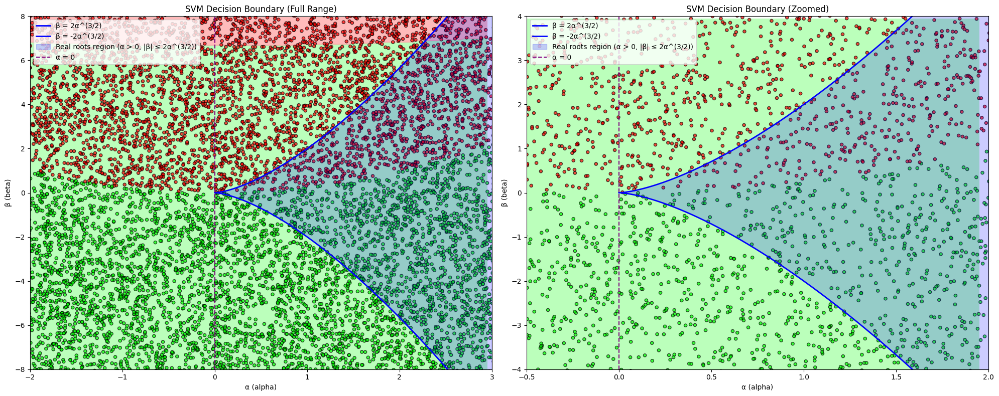

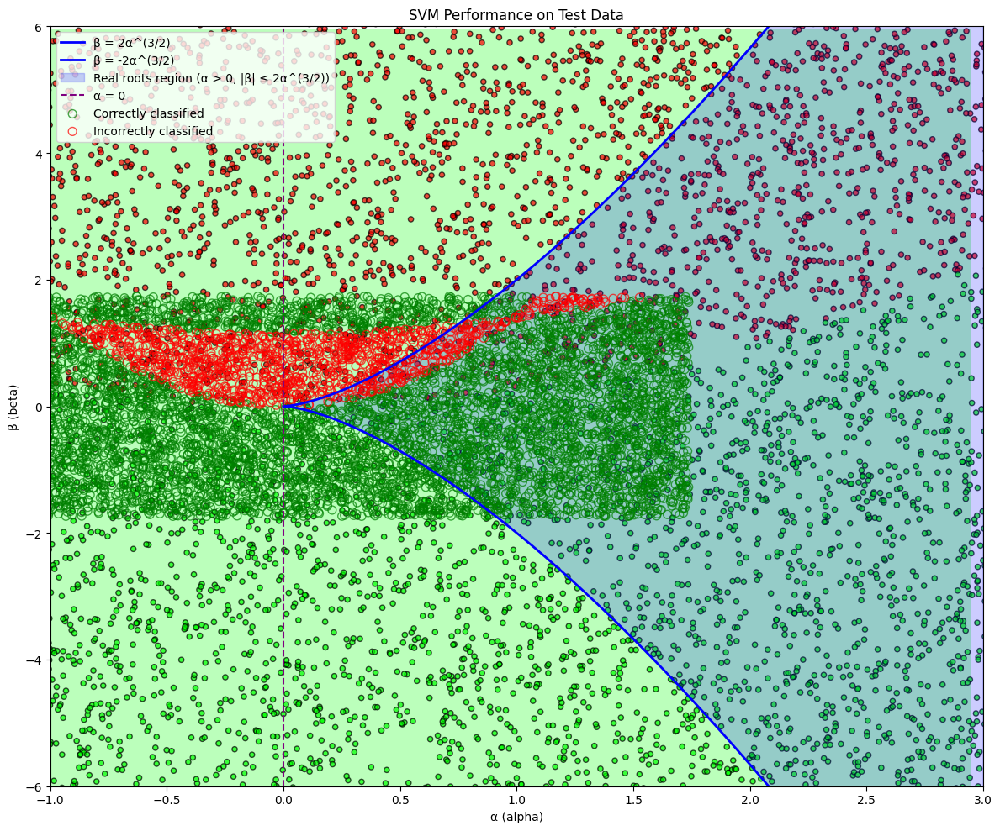

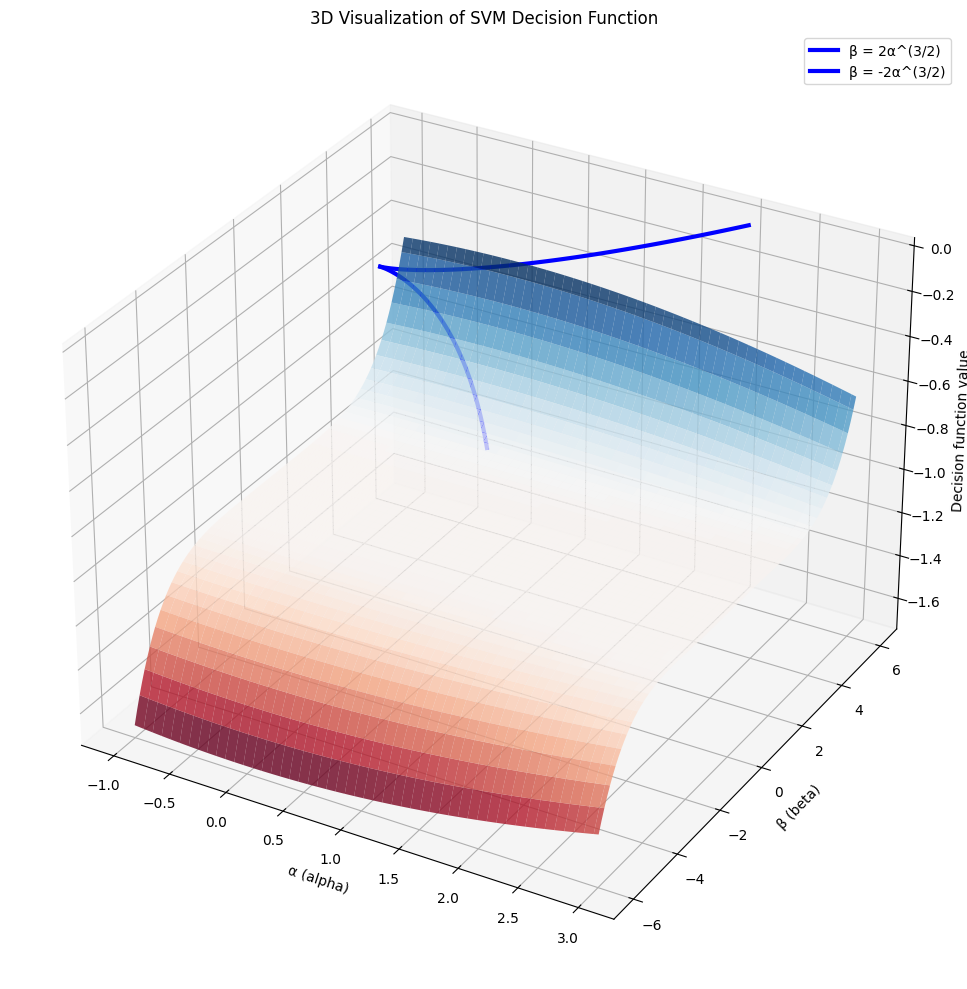


Model Performance Summary:
Accuracy: 0.8541
Precision: 0.8373
Recall: 0.3901
Specificity: 0.9795
F1 Score: 0.5323
AUC: Not available


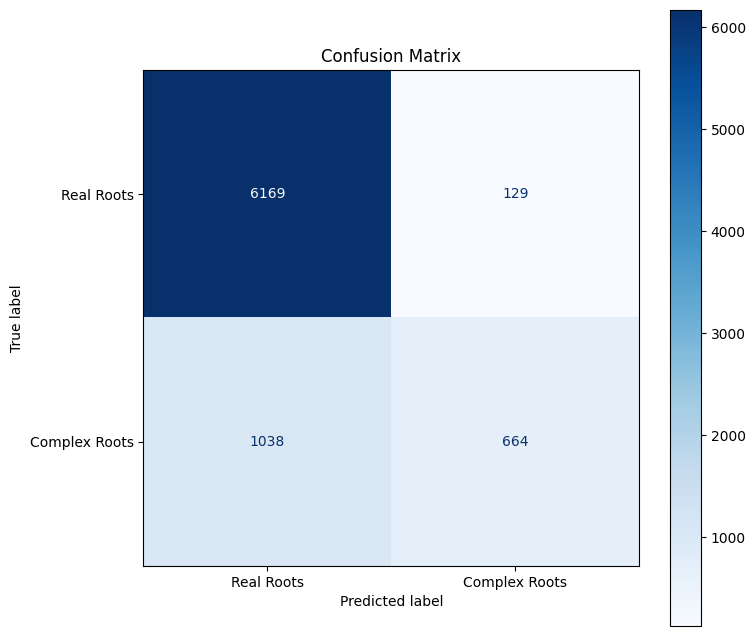

In [17]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

def plot_decision_boundary(X, y, model, scaler, ax=None, title=None, alpha_range=(-2, 3), beta_range=(-8, 8)):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))

    h = 0.05
    x_min, x_max = alpha_range
    y_min, y_max = beta_range

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    mesh_points = np.c_[xx.ravel(), yy.ravel()]

    # Try to match column names if using a scaler trained on a DataFrame
    try:
        mesh_df = pd.DataFrame(mesh_points, columns=X.columns)
        mesh_points_scaled = scaler.transform(mesh_df)
    except:
        mesh_points_scaled = scaler.transform(mesh_points)

    Z = model.predict(mesh_points_scaled)
    Z = Z.reshape(xx.shape)

    cmap_light = ListedColormap(['#AAFFAA', '#FFAAAA'])
    cmap_bold = ListedColormap(['#00FF00', '#FF0000'])

    ax.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.8)
    ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cmap_bold, s=20, edgecolors='k', alpha=0.7)

    ax.set_xlabel('α (alpha)')
    ax.set_ylabel('β (beta)')
    if title:
        ax.set_title(title)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    return ax

# Create visualization
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Plot 1: SVM decision boundary with full dataset
plot_decision_boundary(X, y, svmModel, scaler, ax=axes[0],
                      title='SVM Decision Boundary (Full Range)',
                      alpha_range=(-2, 3), beta_range=(-8, 8))
plot_true_polynomial_curve(ax=axes[0], alpha_range=(-2, 3))
axes[0].legend(loc='upper left')

# Plot 2: Zoomed in view focused on the boundary region
plot_decision_boundary(X, y, svmModel, scaler, ax=axes[1],
                      title='SVM Decision Boundary (Zoomed)',
                      alpha_range=(-0.5, 2), beta_range=(-4, 4))
plot_true_polynomial_curve(ax=axes[1], alpha_range=(-0.5, 2))
axes[1].legend(loc='upper left')

plt.tight_layout()
plt.savefig('svm_polynomial_boundary.png', dpi=300)
plt.show()

# Add a more detailed visualization showing test points and their predictions
fig, ax = plt.subplots(figsize=(12, 10))

# Plot decision boundary
plot_decision_boundary(X, y, svmModel, scaler, ax=ax,
                      title='SVM Performance on Test Data',
                      alpha_range=(-1, 3), beta_range=(-6, 6))
plot_true_polynomial_curve(ax=ax, alpha_range=(-1, 3))

# Highlight test points with wrong predictions
X_test_orig = X_test  # Original (unscaled) test points
wrong_predictions = (y_pred != y_test)
correct_predictions = ~wrong_predictions

# Plot correctly classified points
ax.scatter(X_test_orig[correct_predictions, 0], X_test_orig[correct_predictions, 1],
           s=50, linewidth=1, facecolors='none', edgecolors='green', alpha=0.7,
           label='Correctly classified')

# Plot incorrectly classified points
ax.scatter(X_test_orig[wrong_predictions, 0], X_test_orig[wrong_predictions, 1],
           s=50, linewidth=1, facecolors='none', edgecolors='red', alpha=0.7,
           label='Incorrectly classified')

ax.legend(loc='upper left')
plt.tight_layout()
plt.savefig('svm_test_performance.png', dpi=300)
plt.show()

# Create a 3D visualization of the decision function
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Create a mesh grid
x_min, x_max = -1, 3  # alpha range
y_min, y_max = -6, 6  # beta range
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# Scale the mesh points
mesh_points = np.c_[xx.ravel(), yy.ravel()]
mesh_points_scaled = scaler.transform(mesh_points)

# Get decision function values
Z = svmModel.decision_function(mesh_points_scaled)
Z = Z.reshape(xx.shape)

# Plot the surface
surf = ax.plot_surface(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.8)

# Mark the zero decision boundary with a contour
ax.contour(xx, yy, Z, levels=[0], colors='k', linestyles='-')

# Plot true polynomial curves
alpha_values = np.linspace(0, x_max, 100)
upper_curve = 2 * alpha_values**(3/2)
lower_curve = -2 * alpha_values**(3/2)

# Create mask for valid values within range
upper_mask = (alpha_values >= x_min) & (upper_curve <= y_max) & (upper_curve >= y_min)
lower_mask = (alpha_values >= x_min) & (lower_curve <= y_max) & (lower_curve >= y_min)

# Plot true boundary curves on the Z=0 plane
ax.plot(alpha_values[upper_mask], upper_curve[upper_mask], np.zeros_like(alpha_values[upper_mask]),
        'b-', linewidth=3, label='β = 2α^(3/2)')
ax.plot(alpha_values[lower_mask], lower_curve[lower_mask], np.zeros_like(alpha_values[lower_mask]),
        'b-', linewidth=3, label='β = -2α^(3/2)')

ax.set_xlabel('α (alpha)')
ax.set_ylabel('β (beta)')
ax.set_zlabel('Decision function value')
ax.set_title('3D Visualization of SVM Decision Function')
ax.legend()

plt.tight_layout()
plt.savefig('svm_decision_function_3d.png', dpi=300)
plt.show()

# Print model performance summary
print("\nModel Performance Summary:")
print(f"Accuracy: {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"F1 Score: {f1:.4f}")
if auc is not None:
    print(f"AUC: {auc:.4f}")
else:
    print("AUC: Not available")

# Add a confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Real Roots', 'Complex Roots'])

fig, ax = plt.subplots(figsize=(8, 8))
disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='.0f')
plt.title('Confusion Matrix')
plt.savefig('svm_confusion_matrix.png', dpi=300)
plt.show()


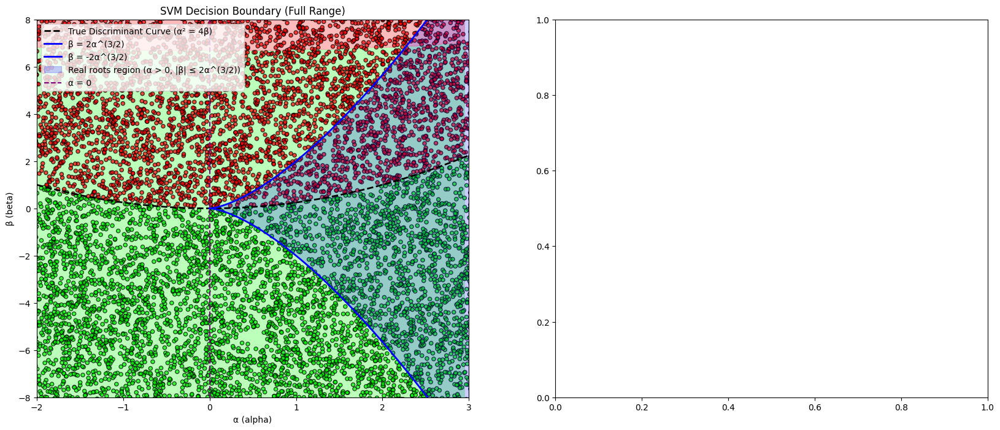

In [18]:
def plot_decision_boundary(X, y, model, scaler, ax=None, title=None, alpha_range=(-2, 3), beta_range=(-8, 8)):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))

    h = 0.05
    x_min, x_max = alpha_range
    y_min, y_max = beta_range

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    mesh_points = np.c_[xx.ravel(), yy.ravel()]

    # Optional: match column names if using a scaler trained on a DataFrame
    try:
        mesh_df = pd.DataFrame(mesh_points, columns=X.columns)
        mesh_points_scaled = scaler.transform(mesh_df)
    except:
        mesh_points_scaled = scaler.transform(mesh_points)

    Z = model.predict(mesh_points_scaled)
    Z = Z.reshape(xx.shape)

    cmap_light = ListedColormap(['#AAFFAA', '#FFAAAA'])
    cmap_bold = ListedColormap(['#00FF00', '#FF0000'])

    ax.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.8)
    ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cmap_bold, s=20, edgecolors='k', alpha=0.7)

    # Plot the true discriminant curve: β = α² / 4
    alpha_vals = np.linspace(x_min, x_max, 1000)
    beta_vals = (alpha_vals**2) / 4
    ax.plot(alpha_vals, beta_vals, 'k--', label='True Discriminant Curve (α² = 4β)', linewidth=2)

    ax.set_xlabel('α (alpha)')
    ax.set_ylabel('β (beta)')
    if title:
        ax.set_title(title)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.legend()

    return ax


# Create visualization
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Plot 1: SVM decision boundary with full dataset
plot_decision_boundary(X, y, svmModel, scaler, ax=axes[0],
                      title='SVM Decision Boundary (Full Range)',
                      alpha_range=(-2, 3), beta_range=(-8, 8))
plot_true_polynomial_curve(ax=axes[0], alpha_range=(-2, 3))
axes[0].legend(loc='upper left')


###Symbolic regression fit and decision tree

In [19]:
pip install gplearn

In [20]:
from gplearn.genetic import SymbolicClassifier
from gplearn.functions import make_function
from sklearn.metrics import classification_report

from gplearn.genetic import SymbolicClassifier

# Patch to add __sklearn_tags__ method
def __sklearn_tags__(self):
    return {
        "non_deterministic": True,
        "requires_y": True,
        "poor_score": True,
        "X_types": ["2darray"],
    }

SymbolicClassifier.__sklearn_tags__ = __sklearn_tags__

# Train symbolic regression model
sym_clf = SymbolicClassifier(population_size=1000,
                             generations=20,
                             stopping_criteria=0.01,
                             p_crossover=0.7,
                             p_subtree_mutation=0.1,
                             p_hoist_mutation=0.05,
                             p_point_mutation=0.1,
                             max_samples=0.9,
                             verbose=1,
                             parsimony_coefficient=0.001,
                             random_state=42)

sym_clf.fit(X_train, y_train)

# Predictions and performance
y_pred_sym = sym_clf.predict(X_test)
print("\nSymbolic Regression Classification Report:")
print(classification_report(y_test, y_pred_sym))

# Print discovered formula
print("Learned symbolic expression:")
print(sym_clf._program)

    |   Population Average    |             Best Individual              |
---- ------------------------- ------------------------------------------ ----------
 Gen   Length          Fitness   Length          Fitness      OOB Fitness  Time Left
   0    36.26           3.0256        9         0.301632         0.305111      4.34m
   1    14.37          1.02779        7          0.26557         0.272114      3.14m
   2    14.24         0.848735       35         0.181994         0.170051      1.31m
   3    17.97         0.707282       37         0.156893         0.158442      1.36m
   4    20.03         0.574904       63        0.0831463        0.0848405      1.08m
   5    25.08         0.465955       67         0.079985        0.0794566      1.17m
   6    31.72         0.435568       47        0.0613206         0.059333      1.10m
   7    30.97         0.396259       77        0.0469092        0.0498375     55.62s
   8    34.60         0.370531       81        0.0309146        0.0304153  

In [25]:
import sympy as sp

# Define symbolic variables
alpha, beta = sp.symbols('alpha beta')

# Define math functions for eval
def add(a, b): return a + b
def sub(a, b): return a - b
def mul(a, b): return a * b
def div(a, b): return a / b

# Raw symbolic regression output (as string!)
symbolic_raw_output = """
add(add(X1, add(X1, sub(add(X1, sub(X1, mul(add(X0, X0), X0))), mul(add(X0, X0), X0)))), div(add(X1, sub(add(X1, sub(add(X1, div(add(X1, sub(add(X1, sub(sub(add(X1, add(X1, add(X1, sub(sub(add(X1, sub(X1, mul(add(X0, X0), X0))), mul(add(X0, X0), X0)), mul(add(X0, X0), X0))))), mul(add(X0, X0), X0)), mul(add(X0, X0), X0))), mul(X0, X0))), 0.274)), mul(add(X0, X0), X0))), mul(X0, X0))), mul(X0, X0)))
"""

# Replace X0, X1 with alpha, beta
symbolic_raw_output = symbolic_raw_output.replace('X0', 'alpha').replace('X1', 'beta')

# Evaluate the expression safely
expr = eval(symbolic_raw_output, {
    'alpha': alpha,
    'beta': beta,
    'add': add,
    'sub': sub,
    'mul': mul,
    'div': div
})

# Simplify
simplified = sp.simplify(expr)

# Display
print(" Simplified Symbolic Expression:")
sp.pprint(simplified, use_unicode=True)

 Simplified Symbolic Expression:
     2                            28.5474452554745⋅β
- 4⋅α  + 4⋅β - 43.1459854014598 + ──────────────────
                                           2        
                                          α         


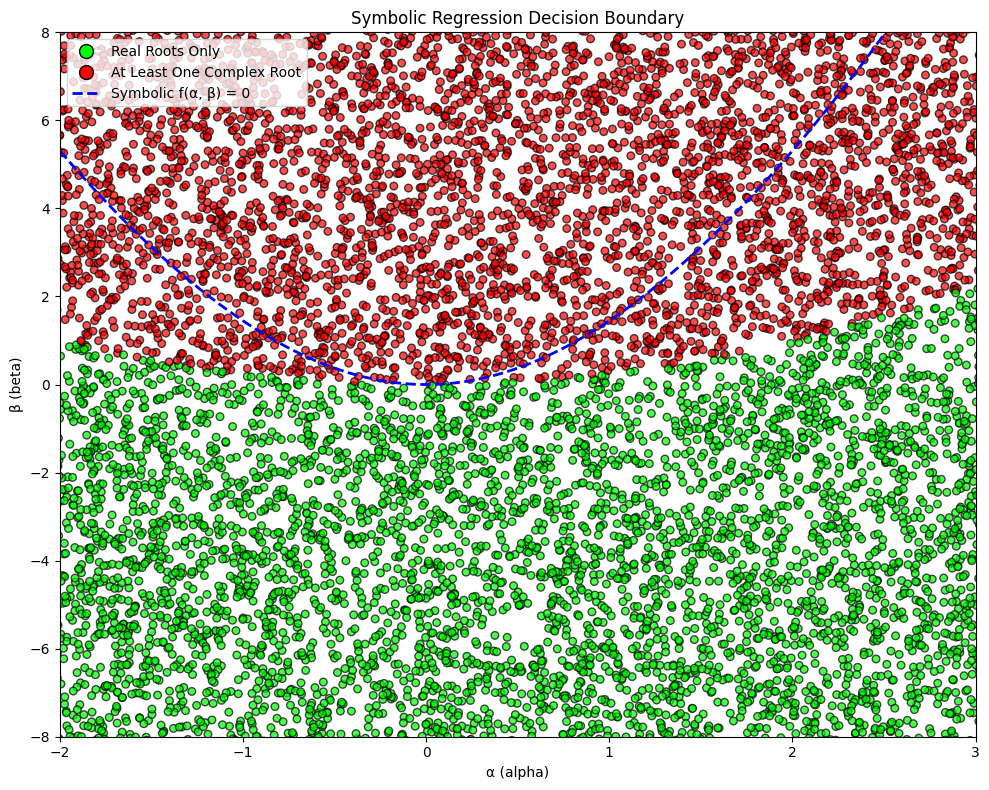

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D
import sympy as sp

# Define symbolic variables and math operations
alpha, beta = sp.symbols('alpha beta')

# Assuming `simplified` is your symbolic expression from earlier:
# If not, define it manually here
# Example: simplified = sp.sympify("beta - 2*alpha**(3/2)")

# Create a lambdified version of the symbolic expression
f_expr = sp.lambdify((alpha, beta), simplified, modules='numpy')

# Rename your X dataframe columns for clarity
X.columns = ['alpha', 'beta']

# Create a grid over the (alpha, beta) space
alpha_vals = np.linspace(-2, 3, 400)
beta_vals = np.linspace(-8, 8, 400)
A, B = np.meshgrid(alpha_vals, beta_vals)

# Evaluate the symbolic expression on the grid
Z = f_expr(A, B)

# Plot the dataset with the symbolic regression boundary
fig, ax = plt.subplots(figsize=(10, 8))

# Colormap for decision classes
cmap_bold = ListedColormap(['#00FF00', '#FF0000'])

# Scatter plot of data points
scatter = ax.scatter(X['alpha'], X['beta'], c=y, cmap=cmap_bold,
                     s=30, edgecolors='k', alpha=0.7)

# Plot the symbolic regression decision boundary: f(α, β) = 0
contour = ax.contour(A, B, Z, levels=[0], colors='blue', linewidths=2, linestyles='--')

# Create proxy artist for the decision boundary in the legend
proxy_line = Line2D([0], [0], linestyle='--', color='blue', linewidth=2)

#Create color legend manually
green_dot = Line2D([0], [0], marker='o', color='w', label='Real Roots Only',
                   markerfacecolor='#00FF00', markersize=10, markeredgecolor='k')
red_dot = Line2D([0], [0], marker='o', color='w', label='At Least One Complex Root',
                 markerfacecolor='#FF0000', markersize=10, markeredgecolor='k')


# Add legend with proxy artist and data points
ax.legend([green_dot, red_dot, proxy_line],
          ['Real Roots Only', 'At Least One Complex Root', 'Symbolic f(α, β) = 0'],
          loc='upper left')

# Add labels and styling
ax.set_xlabel('α (alpha)')
ax.set_ylabel('β (beta)')
ax.set_title('Symbolic Regression Decision Boundary')
ax.set_xlim(-2, 3)
ax.set_ylim(-8, 8)

plt.tight_layout()
plt.savefig('symbolic_regression_boundary.png', dpi=300)
plt.show()

 Symbolic Classifier Accuracy: 0.8800


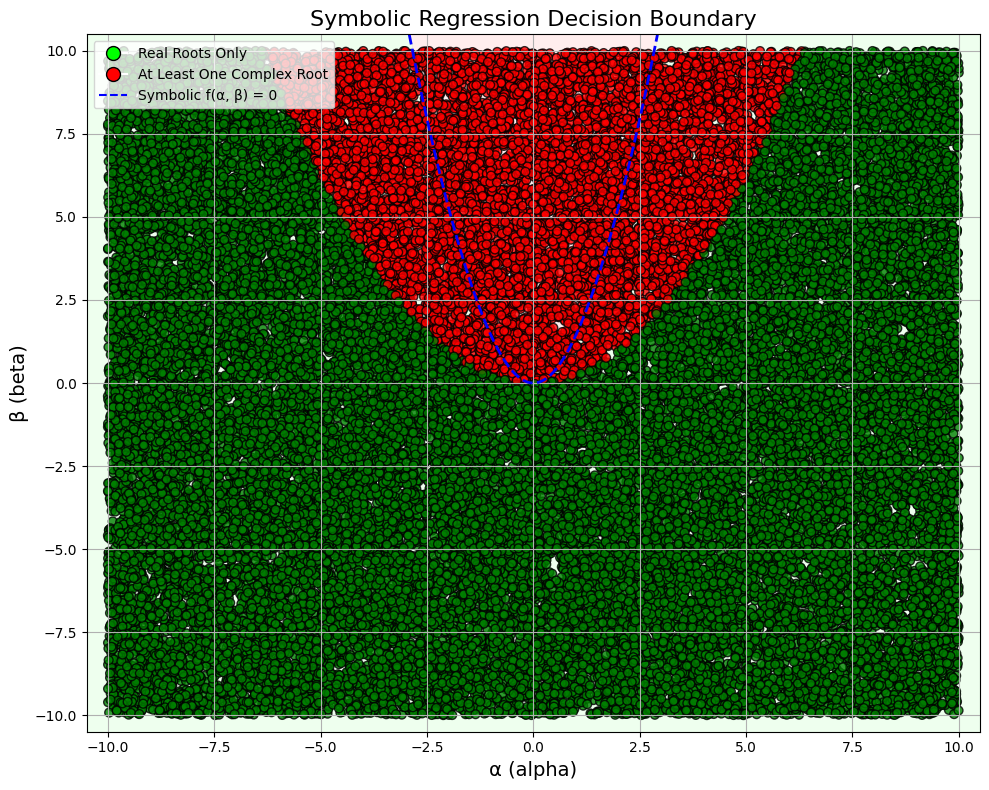

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.metrics import accuracy_score

# Step 1: Apply symbolic function to your dataset
f_values = f_expr(X['alpha'].values, X['beta'].values)
symbolic_preds = (f_values > 0).astype(int)

# Step 2: Evaluate accuracy
accuracy = accuracy_score(y, symbolic_preds)
print(f" Symbolic Classifier Accuracy: {accuracy:.4f}")

# Step 3: Plot decision regions and symbolic boundary
alpha_vals = np.linspace(X['alpha'].min() - 0.5, X['alpha'].max() + 0.5, 400)
beta_vals = np.linspace(X['beta'].min() - 0.5, X['beta'].max() + 0.5, 400)
A, B = np.meshgrid(alpha_vals, beta_vals)
Z = f_expr(A, B)

# Step 4: Plot
fig, ax = plt.subplots(figsize=(10, 8))

# Region background color based on symbolic prediction
cmap_light = ListedColormap(['#AAFFAA', '#FFAAAA'])  # green for real, red for complex
ax.contourf(A, B, Z > 0, alpha=0.2, cmap=cmap_light)

# Scatter plot of true data
scatter = ax.scatter(X['alpha'], X['beta'], c=y, cmap=ListedColormap(['green', 'red']),
                     edgecolors='k', s=40, alpha=0.8, label='Data')

# Symbolic decision boundary: f(alpha, beta) = 0
contour = ax.contour(A, B, Z, levels=[0], colors='blue', linewidths=2, linestyles='--')
proxy_line = plt.Line2D([0], [0], linestyle='--', color='blue', label='Symbolic f(α,β)=0')

# Labels and legend
ax.set_xlabel('α (alpha)', fontsize=14)
ax.set_ylabel('β (beta)', fontsize=14)
ax.set_title('Symbolic Regression Decision Boundary', fontsize=16)

ax.legend([green_dot, red_dot, proxy_line],
          ['Real Roots Only', 'At Least One Complex Root', 'Symbolic f(α, β) = 0'],
          loc='upper left')


ax.set_xlim(alpha_vals.min(), alpha_vals.max())
ax.set_ylim(beta_vals.min(), beta_vals.max())
plt.grid(True)
plt.tight_layout()
plt.show()